# 画像パート　画像処理編

このNotebookは，情報科学演習の画像パート画像処理編に関する資料とコードをまとめたものです．  
基本的には，以下の流れで進めます．

1. 目標
2. デジタル画像処理の基礎知識
3. 基本的な画像処理

## 1. 目標
画像処理編の目標は以下の3点です．
- 画像処理の基礎知識の復習
- 基本的な画像処理のサンプルコード実行(Python)
    - 画像の読み込み
    - グレースケール変換
    - 輝度平滑化
    - ...
- 演習課題を通して画像処理体験

## 2. デジタル画像処理の基礎知識

![画像1の説明](images/1_24.jpg)
![画像2の説明](images/1_25.jpg)
![画像3の説明](images/1_26.jpg)
![画像4の説明](images/1_27.jpg)
![画像5の説明](images/1_28.jpg)
![画像6の説明](images/1_29.jpg)
![画像7の説明](images/1_30.jpg)
![画像8の説明](images/1_31.jpg)
![画像9の説明](images/1_32.jpg) 

## 3. 基本的な画像処理
### 1. ファイル処理
#### 画像の読み込み
openCVを用いて画像を読み込む．

In [44]:
# ライブラリインポート
import cv2
import matplotlib.pyplot as plt
import japanize_matplotlib
import numpy as np
import os
import glob

In [45]:
# 画像の読み込み
img_path = '../data/lenna.jpg'
img = cv2.imread(img_path)

##### 画像の表示
OpenCVはで読み込んだ画像をMatplotlibで表示．  
BGR形式で読み込むため，RGB形式に変換して表示する．  

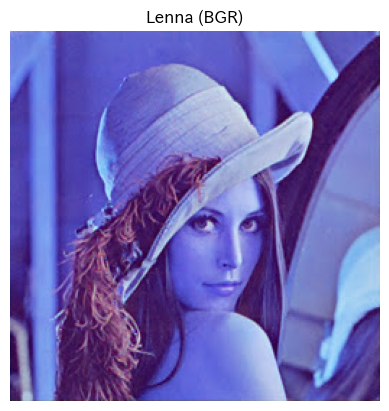

In [46]:
# そのまま描画
plt.imshow(img)
plt.title("Lenna (BGR)")
plt.axis('off')
plt.show()

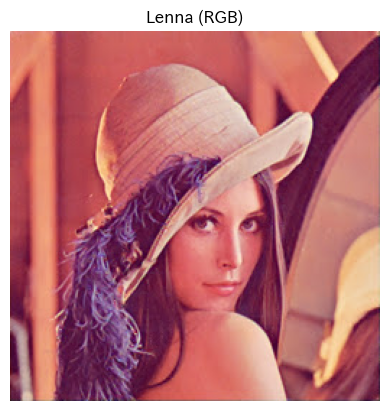

In [47]:
# RGBに変換して描画
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Lenna (RGB)")
plt.axis('off')  # 軸を非表示にする
plt.show()

#### 画像の保存
OpenCVを用いて画像を保存する．  
保存先のディレクトリが存在しない場合は，事前に作成しておく．  

In [48]:
# 画像の保存
save_path = 'output/lenna_saved.png'
os.makedirs(os.path.dirname(save_path), exist_ok=True)
cv2.imwrite(save_path, img)

True

#### 複数画像の一括処理
os,globを用いて，ディレクトリ内の複数画像を一括で処理する．

画像ファイル一覧:
../data/milkdrop.jpg
../data/professor.jpg
../data/professor_noisy2.jpg
../data/lenna.jpg
../data/professor_noisy3.jpg
../data/professor_noisy1.jpg
../data/train.jpg
../data/castle.jpg
../data/logo.jpg
../data/mandrill.jpg


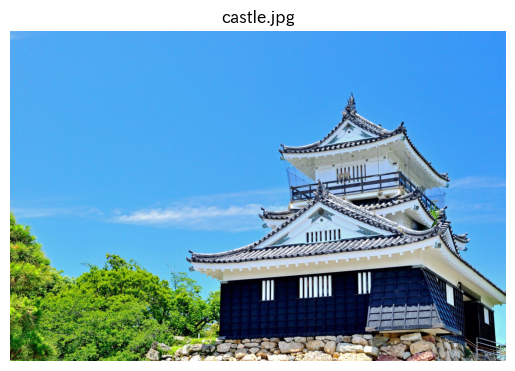

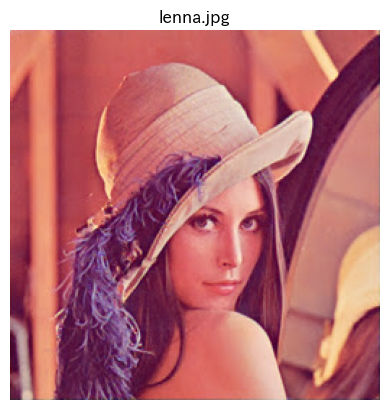

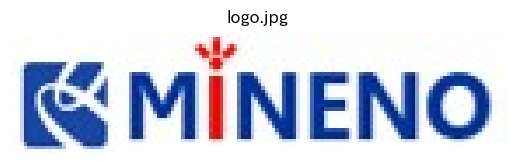

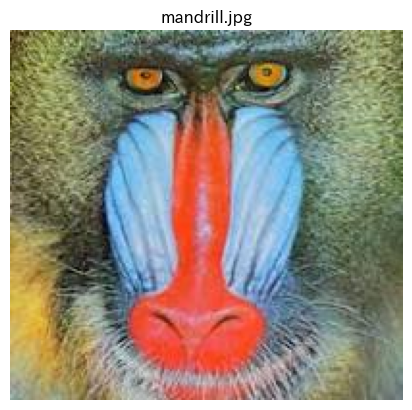

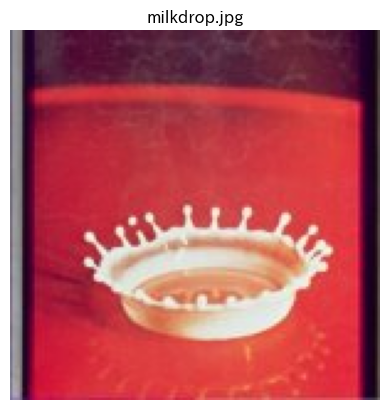

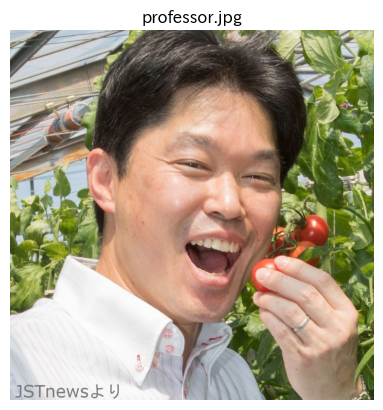

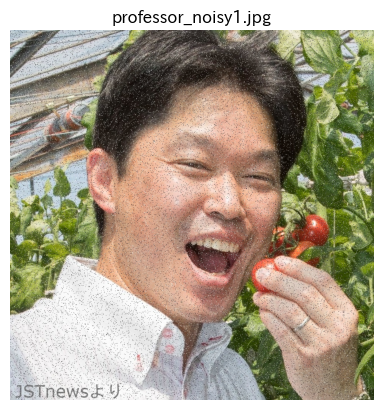

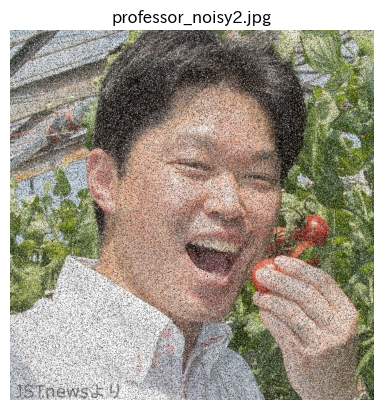

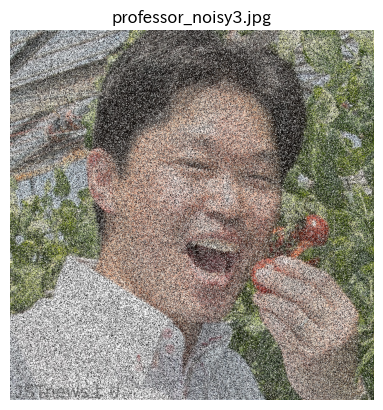

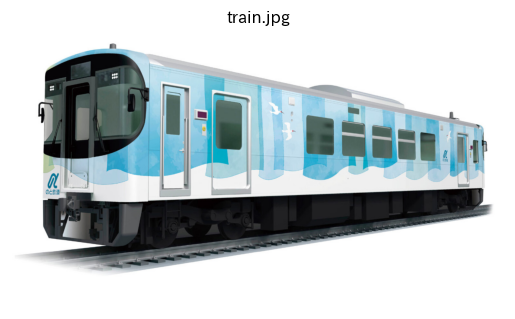

In [49]:
# 複数画像の一括処理

# 指定ディレクトリ内のすべてのjpgファイルを取得
img_dir = '../data/'
img_files = glob.glob(os.path.join(img_dir, '*.jpg'))

# ファイル一覧の表示
print("画像ファイル一覧:")
for f in img_files:
    print(f)

# 画像の表示
img_files.sort()  # ファイル名でソート
for f in img_files:
    img = cv2.imread(f)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(os.path.basename(f))  # ファイル名をタイトルに表示
    plt.show()

#### 複数画像の表示
matplotlibのsubplotを用いて，複数画像を一括で表示する．  

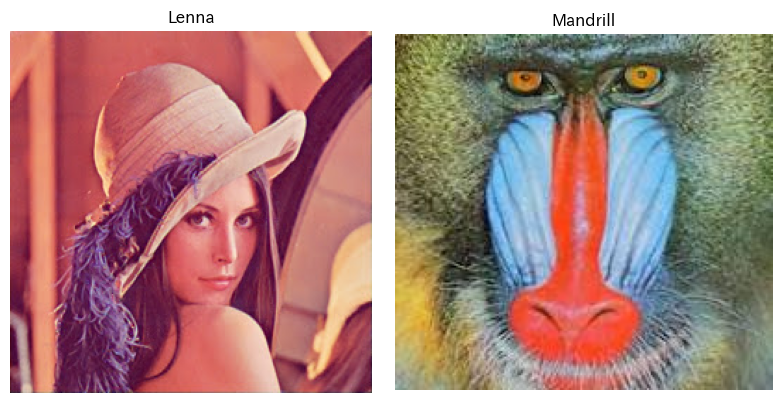

In [50]:
# 画像読み込み
img1 = cv2.imread('../data/lenna.jpg')
img2 = cv2.imread('../data/mandrill.jpg')

# 並べて表示

# plt.figure(figsize=(横幅, 高さ))と指定し，表示領域の大きさを調整
plt.figure(figsize=(8,4))

# plt.subplot(行数, 列数, 何番目)と指定し，表示位置を決定
# 1*2の1番目に描画
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title("Lenna")
plt.axis('off')

# 1*2の2番目に描画
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title("Mandrill")
plt.axis('off')

plt.tight_layout()
plt.show()


#### 演習課題①：dataディレクトリ内にある「bmp」ファイルのみをRGBで読み込み，subplotを用いて2行で表示せよ．

In [51]:
# 解答欄


### 2. 色の処理

#### グレースケール変換
RGBの3チャンネル（赤・緑・青）を輝度情報に変換し，1チャンネルにする．  
人間の視覚特性に基づき，以下の加重平均で計算される．  
Y = 0.299 R + 0.587 G + 0.114 B

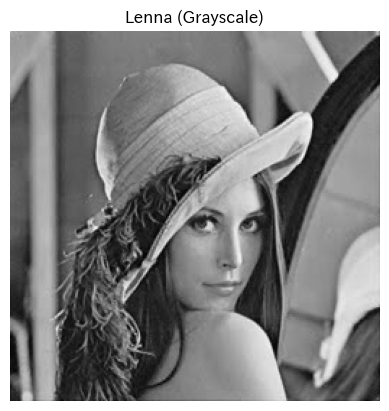

In [52]:
import cv2
import matplotlib.pyplot as plt

# 画像の読み込み
img = cv2.imread('../data/lenna.jpg')

# グレースケール変換
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 表示
plt.imshow(gray, cmap='gray')
plt.title("Lenna (Grayscale)")
plt.axis('off')
plt.show()

#### 2値化
ある閾値(thresh)を基準に，明るい部分を白(255)，暗い部分を黒(0)に変換する．

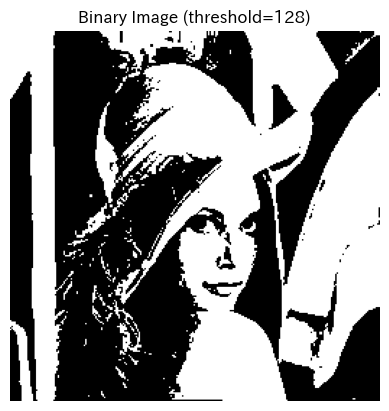

In [53]:
# 固定閾値による2値化
thresh = 128
_, binary = cv2.threshold(gray, thresh, 255, cv2.THRESH_BINARY)

plt.imshow(binary, cmap='gray')
plt.title(f"Binary Image (threshold={thresh})")
plt.axis('off')
plt.show()


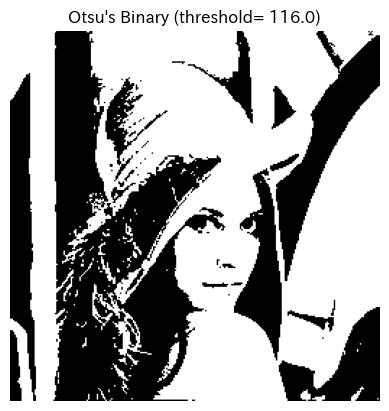

In [54]:
# 大津の2値化（Otsu）
thresh, binary_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.imshow(binary_otsu, cmap='gray')
plt.title(f"Otsu's Binary (threshold={thresh: .1f})")
plt.axis('off')
plt.show()


#### ヒストグラム表示
画像内の画素値の分布をヒストグラムで表示する．  
暗い画像は左側に，明るい画像は右側にピークが寄る．

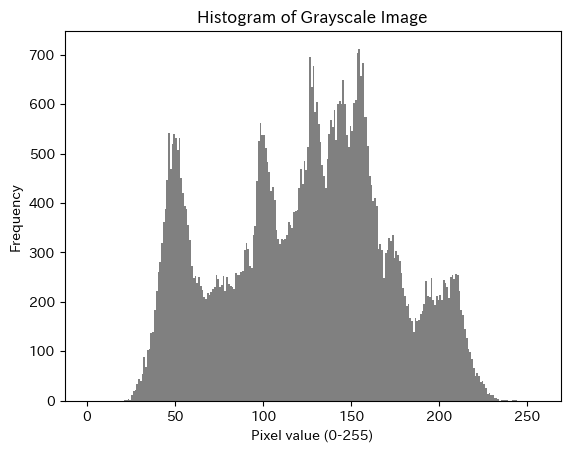

In [55]:
plt.hist(gray.ravel(), bins=256, range=(0,256), color='gray')
plt.title("Histogram of Grayscale Image")
plt.xlabel("Pixel value (0-255)")
plt.ylabel("Frequency")
plt.show()

#### ヒストグラム平坦化
輝度分布を均等に広げることでコントラストを強調することで，明るい部分と暗い部分の差を大きくなり，見やすくなる．

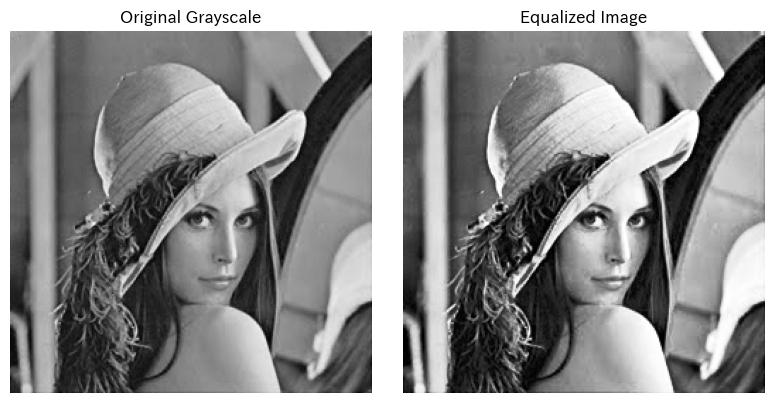

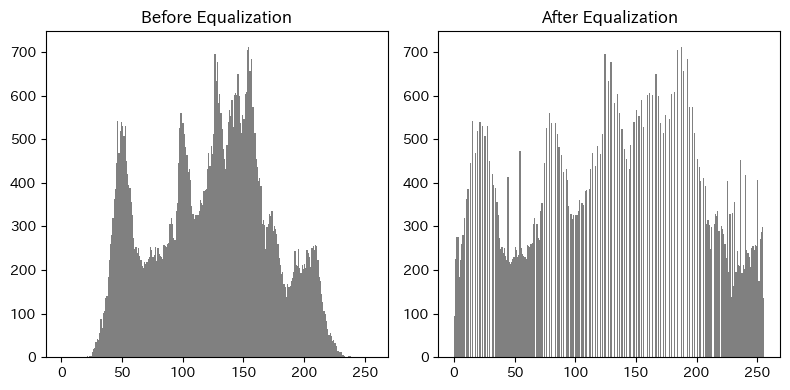

In [56]:
# ヒストグラム平坦化
equalized = cv2.equalizeHist(gray)

# 元画像と比較表示
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(gray, cmap='gray')
plt.title("Original Grayscale")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(equalized, cmap='gray')
plt.title("Equalized Image")
plt.axis('off')

plt.tight_layout()
plt.show()

# ヒストグラムの比較
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.hist(gray.ravel(), bins=256, range=(0,256), color='gray')
plt.title("Before Equalization")

plt.subplot(1,2,2)
plt.hist(equalized.ravel(), bins=256, range=(0,256), color='gray')
plt.title("After Equalization")

plt.tight_layout()
plt.show()


#### 色空間変換(RGB <-> HSV)
RGB色空間は，赤(Red)，緑(Green)，青(Blue)の3原色の組み合わせで色を表現する．  
HSV色空間は，色相(Hue)，彩度(Saturation)，明度(Value)の3つの要素で色を表現する．  
HSV色空間で扱うことで，色の特徴をより直感的に捉えることができる．  
<img src="images/HSV.jpg" width="700">
<br>

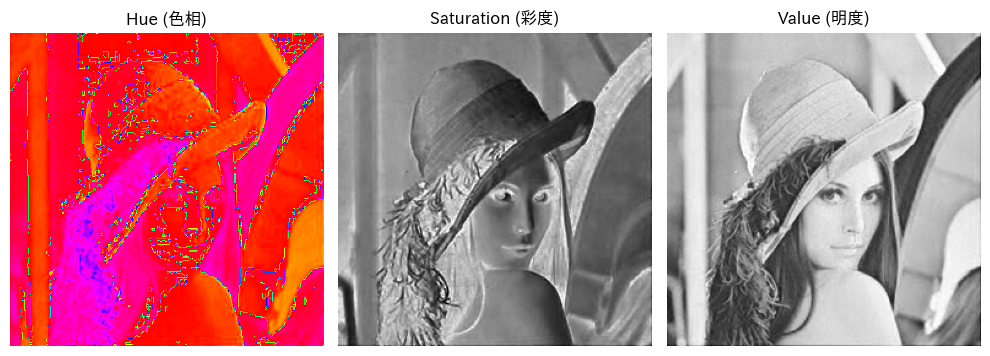

In [57]:
# RGB → HSV
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# HSVチャンネル分割
h, s, v = cv2.split(hsv)

# 表示
plt.figure(figsize=(10,4))
plt.subplot(1,3,1)
plt.imshow(h, cmap='hsv')
plt.title("Hue (色相)")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(s, cmap='gray')
plt.title("Saturation (彩度)")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(v, cmap='gray')
plt.title("Value (明度)")
plt.axis('off')

plt.tight_layout()
plt.show()


#### 演習課題②-1：../data/milkdrop.jpgをグレースケール変換し，ヒストグラムを表示せよ．

In [58]:
# 解答欄

#### 演習課題②-2：ヒストグラム上で閾値の当りをつけ，2値化した画像を表示せよ．

In [59]:
# 解答欄

#### 演習課題②-3：大津の二値化を用いて，2値化した画像を表示せよ．

In [60]:
# 解答欄

### 3. 幾何学変換
画像の幾何学変換とは，「画像の座標系を変換する処理」のことを指す．  
代表的なものには，リサイズ・トリミング・回転・アフィン変換・射影変換などがある．  
これらは，`cv2.resize`, `cv2.warpAffine`, `cv2.warpPerspective` などで実現できる．

#### リサイズ
画像の大きさを変更する処理．  
OpenCV では `cv2.resize()` を使用する．  
デフォルトでは，縮小時はエリア平均補完，拡大時は双曲線補完が適用される．

Original image size: (256, 256, 3)


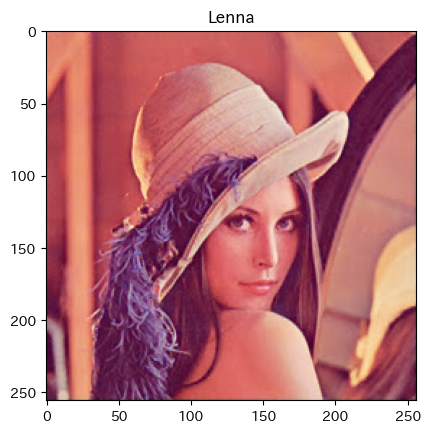

In [61]:
# 通常のRGB画像
img = cv2.imread('../data/lenna.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

print("Original image size:", img_rgb.shape)
# 表示
plt.imshow(img_rgb)
plt.title("Lenna")
plt.show()


Quarter size image: (64, 64, 3)


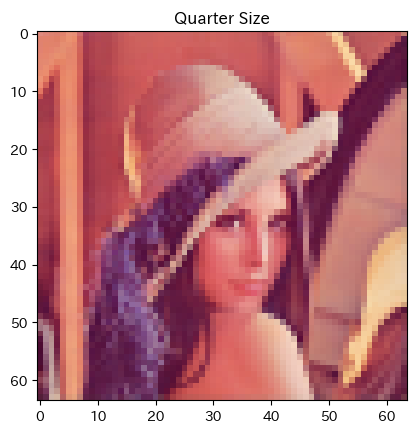

In [62]:
# 1/4のサイズに縮小
img_quarter = cv2.resize(img_rgb, (0, 0), fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA)
print("Quarter size image:", img_quarter.shape)
plt.imshow(img_quarter)
plt.title("Quarter Size")
plt.show()

Double size image: (512, 512, 3)


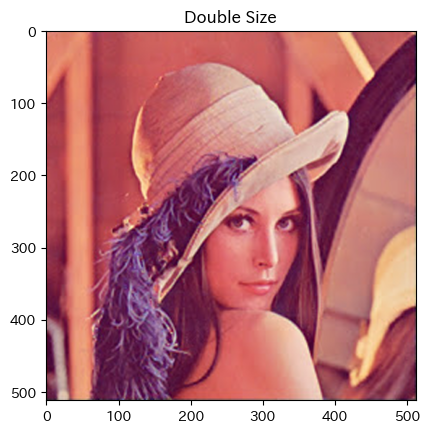

In [63]:
# 2倍のサイズに拡大
img_double = cv2.resize(img_rgb, (0, 0), fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
print("Double size image:", img_double.shape)
plt.imshow(img_double)
plt.title("Double Size")
plt.show()


#### トリミング
画像の一部を切り出す処理．  
配列スライス（`img[y1:y2, x1:x2]`）で簡単に実現できる． 

Cropped image size: (128, 128, 3)


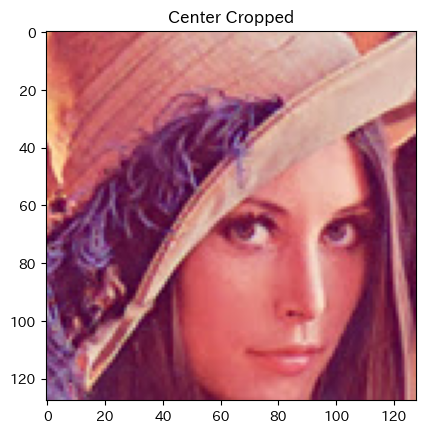

In [64]:
# 画像の中央をトリミング
h, w = img_rgb.shape[:2]
x1, y1 = w//4, h//4
x2, y2 = w*3//4, h*3//4
img_crop = img_rgb[y1:y2, x1:x2]

print("Cropped image size:", img_crop.shape)

plt.imshow(img_crop)
plt.title("Center Cropped")
plt.show()


Top-left cropped image size: (128, 128, 3)


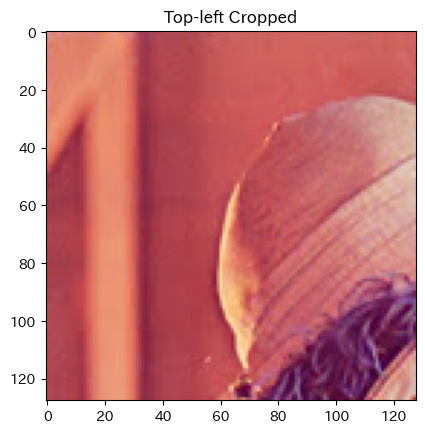

In [65]:
# 画像の左上をトリミング
img_crop_tl = img_rgb[0:h//2, 0:w//2]
print("Top-left cropped image size:", img_crop_tl.shape)
plt.imshow(img_crop_tl)
plt.title("Top-left Cropped")
plt.show()  

#### 回転
画像を任意の角度だけ回転させる．  
`cv2.getRotationMatrix2D()` で回転行列を作成し，`cv2.warpAffine()` で変換を適用する．

Rotated image size: (256, 256, 3)


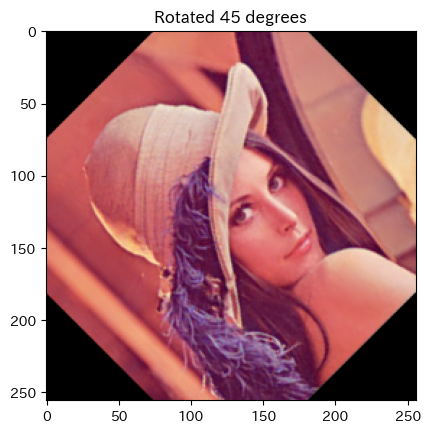

In [66]:
h, w = img_rgb.shape[:2]
center = (w//2, h//2)

# 45度回転（時計回り）
M = cv2.getRotationMatrix2D(center, 45, 1.0)
img_rot45 = cv2.warpAffine(img_rgb, M, (w, h))

print("Rotated image size:", img_rot45.shape)
plt.imshow(img_rot45)
plt.title("Rotated 45 degrees")
plt.show()

Rotated image size: (256, 256, 3)


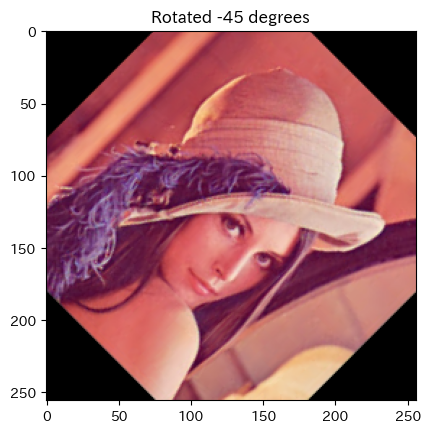

In [67]:
# 反時計周り
M = cv2.getRotationMatrix2D(center, -45, 1.0)
img_rot_neg45 = cv2.warpAffine(img_rgb, M, (w, h))
print("Rotated image size:", img_rot_neg45.shape)
plt.imshow(img_rot_neg45) 
plt.title("Rotated -45 degrees")
plt.show()

#### アフィン変換
アフィン変換は「平行移動＋拡大縮小＋回転＋せん断」を組み合わせた線形変換．  
さっきやった拡大や回転もアフィン変換でできる．  
3点の対応関係を指定して，`cv2.getAffineTransform()` で行列を作り，`cv2.warpAffine()` で適用する．

Affine transformed image size: (256, 256, 3)


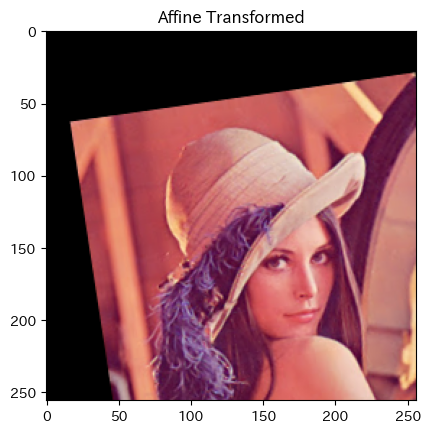

In [68]:
# 3点の対応を指定
src_pts = np.float32([[50, 50], [200, 50], [50, 200]])
dst_pts = np.float32([[70, 100], [210, 80], [90, 230]])

# 変換行列を計算
M = cv2.getAffineTransform(src_pts, dst_pts)
img_affine = cv2.warpAffine(img_rgb, M, (w, h))
print("Affine transformed image size:", img_affine.shape)
plt.imshow(img_affine)
plt.title("Affine Transformed")
plt.show()


3点指定が面倒な場合はMを直接記述しても良い．

Shifted image size: (256, 256, 3)


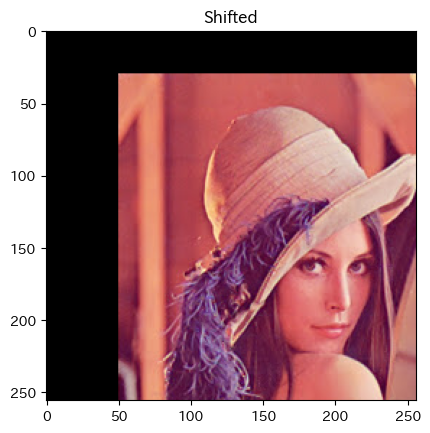

In [69]:
# 平行移動
tx, ty = 50, 30  # x方向に50px, y方向に30px移動
M_shift = np.float32([[1, 0, tx], [0, 1, ty]])
img_shift = cv2.warpAffine(img_rgb, M_shift, (w, h))
print("Shifted image size:", img_shift.shape) 
plt.imshow(img_shift)
plt.title("Shifted")
plt.show()

Rotated image size: (256, 256, 3)


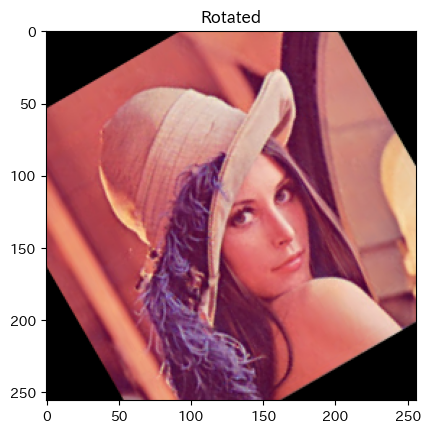

In [70]:
# 回転
(h, w) = img.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, angle=30, scale=1.0)
img_rot = cv2.warpAffine(img_rgb, M, (w, h))

print("Rotated image size:", img_rot.shape)
plt.imshow(img_rot)
plt.title("Rotated")
plt.show()

Scaled image size: (256, 256, 3)


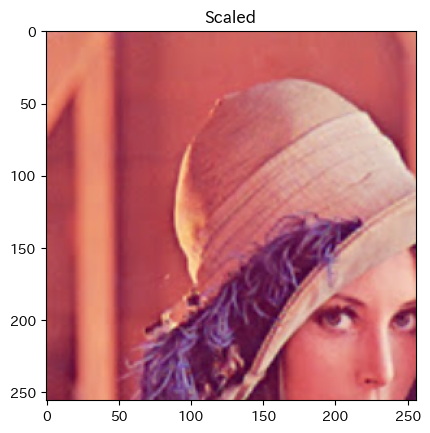

In [71]:
# 拡大
M = np.float32([[1.5, 0, 0], [0, 1.5, 0]])
img_scale = cv2.warpAffine(img_rgb, M, (int(w), int(h)))
print("Scaled image size:", img_scale.shape)
plt.imshow(img_scale)
plt.title("Scaled")
plt.show()

Sheared image size: (256, 256, 3)


Text(0.5, 1.0, 'Sheared')

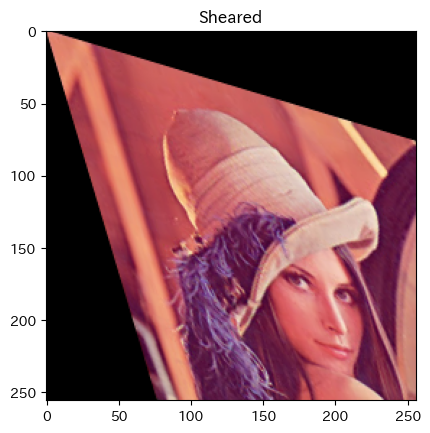

In [72]:
# せん断の例
import numpy as np
M = np.float32([[1, 0.3, 0], [0.3, 1, 0]])  # x方向に0.3, y方向に0.3のせん断
img_shear = cv2.warpAffine(img_rgb, M, (w, h))
print("Sheared image size:", img_shear.shape)
plt.imshow(img_shear)
plt.title("Sheared")        

※せん断とは，四角形の画像を平行四辺形に変形するような変換のこと．

#### 射影変換
射影変換では，画像を別の平面へ投影するような変換を行う．  
例えば，斜めから見た画像を正面視点に補正するなどに使われる．  
4点の対応を指定し，`cv2.getPerspectiveTransform()` と `cv2.warpPerspective()` を用いる．

Perspective transformed image size: (256, 256, 3)


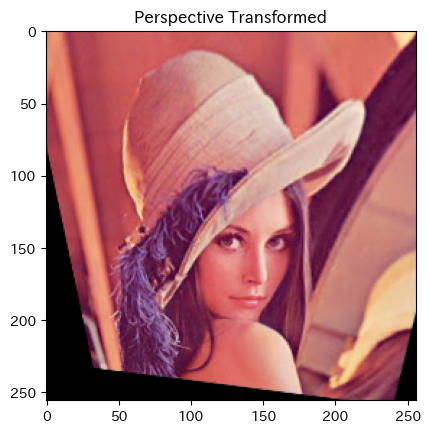

In [73]:
# 元画像の4点 (左上, 右上, 右下, 左下)
src_pts = np.float32([[50, 50], [200, 50], [200, 200], [50, 200]])

# 変換後の4点（斜めに変形）
dst_pts = np.float32([[40, 60], [210, 40], [190, 210], [60, 200]])

# 変換行列を計算
M = cv2.getPerspectiveTransform(src_pts, dst_pts)
img_persp = cv2.warpPerspective(img_rgb, M, (w, h))

print("Perspective transformed image size:", img_persp.shape)
plt.imshow(img_persp)
plt.title("Perspective Transformed")
plt.show()


Strong perspective transformed image size: (256, 256, 3)


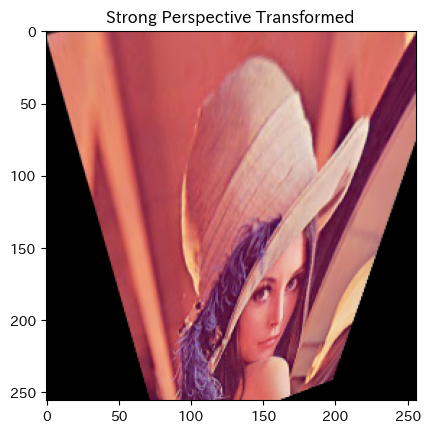

In [74]:
# より大きく傾けた変換（遠近効果を強調）
src_pts = np.float32([[50, 50], [200, 50], [200, 200], [50, 200]])
dst_pts = np.float32([[80, 100], [220, 50], [180, 220], [100, 250]])

M_strong = cv2.getPerspectiveTransform(src_pts, dst_pts)
img_persp_strong = cv2.warpPerspective(img_rgb, M_strong, (w, h))

print("Strong perspective transformed image size:", img_persp_strong.shape)
plt.imshow(img_persp_strong)
plt.title("Strong Perspective Transformed")
plt.show()

#### 演習課題③：../data/mandrill.jpgに対して，トリミング，リサイズ，回転，アフィン変換を行い，結果をsubplotで表示せよ．

In [75]:
# 解答欄

### 4. フィルタ処理

#### ガウシアンフィルタ（ノイズ低減）
ガウシアンフィルタは，画像のノイズを低減し，平滑化するために使用される．
加重平均（中心に近い画素ほど重みが大きい）を用いて，ノイズを抑えつつ画像の特徴を保持する．

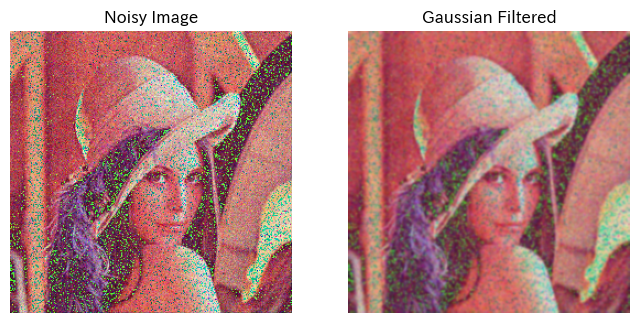

In [76]:
# ノイズを追加してからガウシアン適用
img_noisy = img_rgb + np.random.normal(0, 25, img_rgb.shape).astype(np.uint8)
img_gauss = cv2.GaussianBlur(img_noisy, (5, 5), 1.0)

plt.figure(figsize=(8,4))
plt.subplot(1, 2, 1)
plt.imshow(img_noisy)
plt.axis('off')
plt.title("Noisy Image")

plt.subplot(1, 2, 2)
plt.imshow(img_gauss)
plt.axis('off')
plt.title("Gaussian Filtered")
plt.show()


#### メディアンフィルタ（スパイクノイズ除去）
各ピクセルをその近傍の中央値で置き換えるフィルタ．  
スパイクノイズ（塩胡椒ノイズ）に対して効果的．

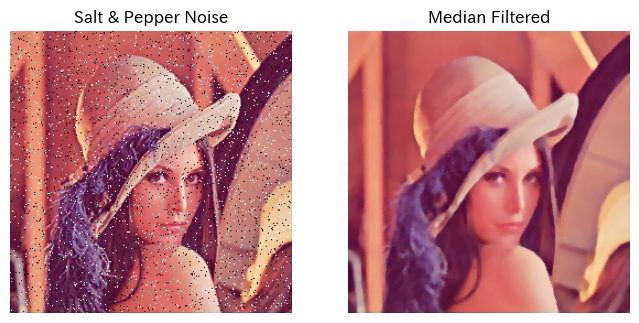

In [77]:
# --- Median Filter ---
img_sp = img_rgb.copy()
noise_prob = 0.02
num_salt = np.ceil(noise_prob * img_sp.size * 0.5).astype(int)
num_pepper = np.ceil(noise_prob * img_sp.size * 0.5).astype(int)

# 塩ノイズ（白点）
coords = [np.random.randint(0, i - 1, num_salt) for i in img_sp.shape[:2]]
img_sp[coords[0], coords[1]] = 255

# 胡椒ノイズ（黒点）
coords = [np.random.randint(0, i - 1, num_pepper) for i in img_sp.shape[:2]]
img_sp[coords[0], coords[1]] = 0

img_median = cv2.medianBlur(img_sp, 5)

plt.figure(figsize=(8,4))
plt.subplot(1, 2, 1)
plt.imshow(img_sp)
plt.axis('off')
plt.title("Salt & Pepper Noise")

plt.subplot(1, 2, 2)
plt.imshow(img_median)
plt.axis('off')
plt.title("Median Filtered")
plt.show()


#### ソーベルフィルタ（エッジ検出）
ソーベルフィルタは，画像のエッジ（境界）を検出するために使用される．  
X方向とY方向の勾配を計算し，エッジの強度と方向を求める．

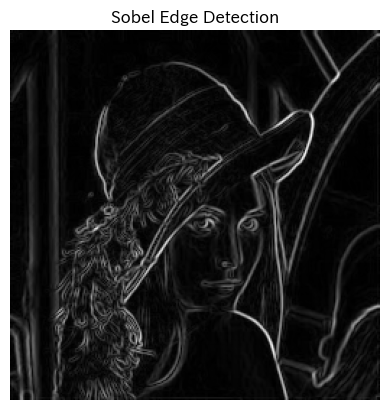

In [78]:
# --- Sobel Filter ---
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel = cv2.magnitude(sobelx, sobely)

plt.imshow(sobel, cmap='gray')
plt.axis('off')
plt.title("Sobel Edge Detection")
plt.show()


#### ラプラシアンフィルタ（エッジ検出）
2次微分を用いてエッジを検出するフィルタ．

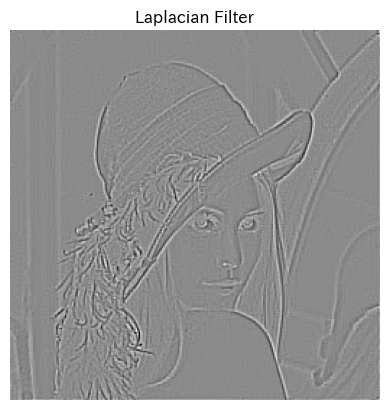

In [79]:
# --- Laplacian Filter ---
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
lap = cv2.Laplacian(gray, cv2.CV_64F, ksize=3)

plt.imshow(lap, cmap='gray')
plt.axis('off')
plt.title("Laplacian Filter")
plt.show()


#### Cannyフィルタ（エッジ検出）
ガウシアンフィルタとソーベルフィルタを組み合わた手法．  
エッジ検出を行う際は最初にこの手法を試すことが多い．

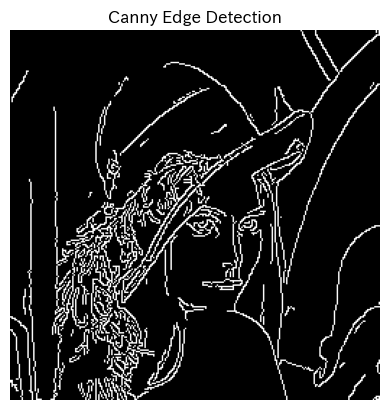

In [80]:
# --- Canny Edge Detection ---
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
edges = cv2.Canny(gray, 100, 200)

plt.imshow(edges, cmap='gray')
plt.axis('off')
plt.title("Canny Edge Detection")
plt.show()


#### 演習課題④:../data/professor_noisy1.jpg~~../data/professor_noisy3.jpgに対して，ノイズ除去フィルタを適用し，除去前画像と除去後画像を表示せよ

### 5. その他

#### 輪郭抽出
輪郭抽出は，画像内の物体の境界を検出する手法．  
OpenCVの`cv2.findContours()`を用いて，2値化画像から輪郭を抽出できる．  
人工物は輪郭がはっきりしているため，輪郭抽出が有効だが，自然物は輪郭が複雑でノイズも多いため，うまくいかないことが多い．  
近年は，深層学習を用いたセグメンテーション手法が主流になっている．

Contour image size: (256, 256, 3)


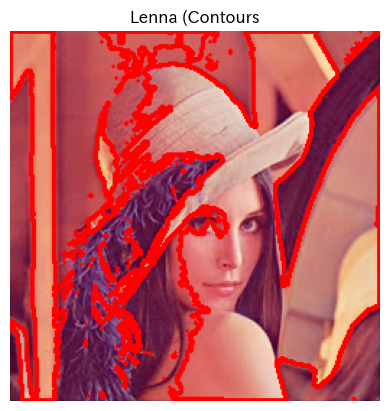

In [81]:
# --- Contour Detection ---
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
_, binary = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_contour = img_rgb.copy()
cv2.drawContours(img_contour, contours, -1, (255, 0, 0), 2)

print("Contour image size:", img_contour.shape)
plt.imshow(img_contour)
plt.title("Lenna (Contours")
plt.axis('off')
plt.show()


Contour image size: (192, 204, 3)


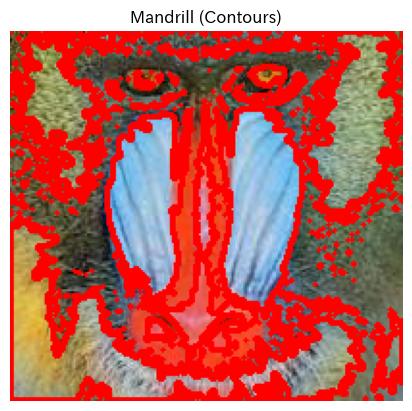

In [82]:
# mandrill画像の輪郭検出
img_mandrill = cv2.imread('../data/mandrill.jpg')
img_mandrill_rgb = cv2.cvtColor(img_mandrill, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(img_mandrill, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_contour = img_mandrill_rgb.copy()
cv2.drawContours(img_contour, contours, -1, (255, 0, 0), 2)

print("Contour image size:", img_contour.shape)
plt.imshow(img_contour)
plt.title("Mandrill (Contours)")
plt.axis('off')
plt.show()


Contour image size: (150, 150, 3)


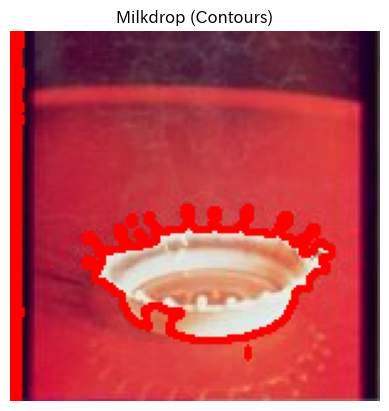

In [83]:
# milkdrop画像の輪郭検出
img_milk = cv2.imread('../data/milkdrop.jpg')
img_milk_rgb = cv2.cvtColor(img_milk, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(img_milk_rgb, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_contour = img_milk_rgb.copy()
cv2.drawContours(img_contour, contours, -1, (255, 0, 0), 2)

print("Contour image size:", img_contour.shape)
plt.imshow(img_contour)
plt.title("Milkdrop (Contours)")
plt.axis('off')
plt.show()

#### Hough変換（直線検出）
画像のエッジ情報から，直線を検出する手法．  
エッジ検出後に，`cv2.HoughLines()` や `cv2.HoughLinesP()` を用いて直線を検出する．  

Hough Line image size: (256, 256, 3)


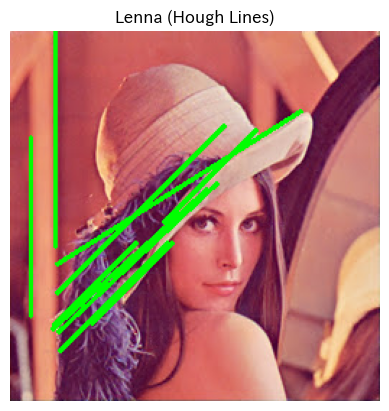

In [84]:
# --- Hough Line Detection ---
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
edges = cv2.Canny(gray, 50, 150)

lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=100, minLineLength=50, maxLineGap=10)
img_hough = img_rgb.copy()
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(img_hough, (x1, y1), (x2, y2), (0, 255, 0), 2)

print("Hough Line image size:", img_hough.shape)
plt.imshow(img_hough)
plt.title("Lenna (Hough Lines)")
plt.axis('off')
plt.show()


Hough Line image size: (861, 1536, 3)


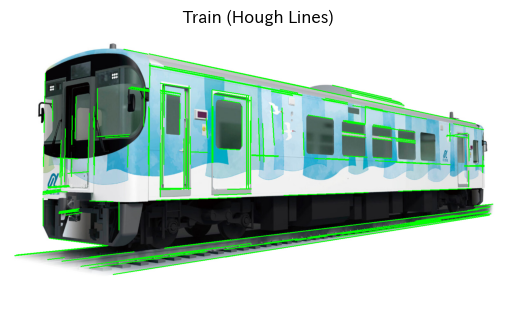

In [85]:
train_img = cv2.imread('../data/train.jpg', cv2.IMREAD_COLOR)
train_img_rgb = cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(train_img_rgb, cv2.COLOR_RGB2GRAY)
edges = cv2.Canny(gray, 50, 150)
lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=100, minLineLength=50, maxLineGap=10)
img_hough = train_img_rgb.copy()
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(img_hough, (x1, y1), (x2, y2), (0, 255, 0), 2)
print("Hough Line image size:", img_hough.shape)
plt.imshow(img_hough)
plt.title("Train (Hough Lines)")
plt.axis('off')
plt.show()

#### テンプレートマッチング
テンプレートマッチングは，画像内で特定のパターン（テンプレート）を検出する手法．  
テンプレート画像と入力画像の類似度を計算し，最も類似している位置を特定する．

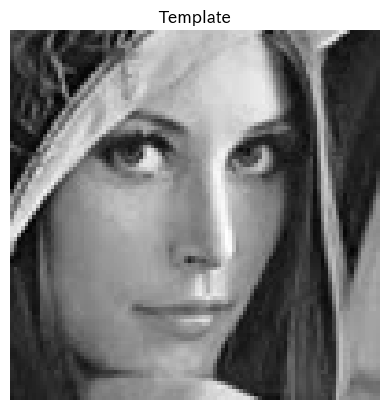

Template Matching image size: (256, 256, 3)


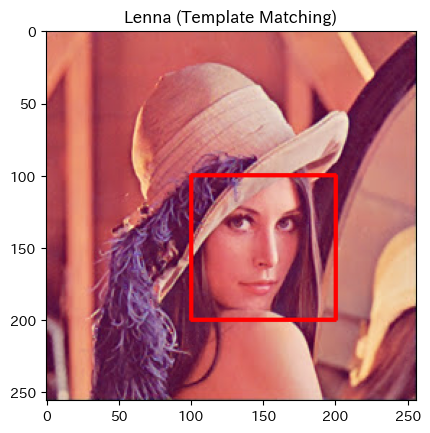

In [86]:
template = cv2.cvtColor(img_rgb[100:200, 100:200], cv2.COLOR_RGB2GRAY)  # 適当に切り出し
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# templateを表示
plt.imshow(template, cmap='gray')
plt.title("Template")
plt.axis('off')
plt.show()

res = cv2.matchTemplate(gray, template, cv2.TM_CCOEFF_NORMED)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

top_left = max_loc
h, w = template.shape
bottom_right = (top_left[0]+w, top_left[1]+h)

img_match = img_rgb.copy()
cv2.rectangle(img_match, top_left, bottom_right, (255,0,0), 2)

print("Template Matching image size:", img_match.shape)
plt.imshow(img_match)
plt.title("Lenna (Template Matching)")
plt.show()
